# **Sales Analysis**

**Import Libraries**

In [4]:
import pandas as pd
import os

**Merging 12 monts of sales data into a single file**

In [7]:
df = pd.read_csv('/content/2019 Sales/Sales_April_2019.csv')

files = [file for file in os.listdir('/content/2019 Sales')]

all_months_data = pd.DataFrame()

for file in files:
  df = pd.read_csv('/content/2019 Sales/'+file)
  all_months_data = pd.concat([all_months_data, df])

all_months_data.to_csv('2019_sales.csv', index=False)

**Read updated dataframe**

In [8]:
all_data = pd.read_csv('2019_sales.csv')
all_data.head()

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address
0,248151,AA Batteries (4-pack),4,3.84,09/17/19 14:44,"380 North St, Los Angeles, CA 90001"
1,248152,USB-C Charging Cable,2,11.95,09/29/19 10:19,"511 8th St, Austin, TX 73301"
2,248153,USB-C Charging Cable,1,11.95,09/16/19 17:48,"151 Johnson St, Los Angeles, CA 90001"
3,248154,27in FHD Monitor,1,149.99,09/27/19 07:52,"355 Hickory St, Seattle, WA 98101"
4,248155,USB-C Charging Cable,1,11.95,09/01/19 19:03,"125 5th St, Atlanta, GA 30301"


**Data Cleaning**

Drop rows with NAN

In [14]:
nan_df = all_data[all_data.isna().any(axis=1)]
nan_df.head()

all_data = all_data.dropna(how='all')
all_data.head()

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address,Month
0,248151,AA Batteries (4-pack),4,3.84,09/17/19 14:44,"380 North St, Los Angeles, CA 90001",09
1,248152,USB-C Charging Cable,2,11.95,09/29/19 10:19,"511 8th St, Austin, TX 73301",09
2,248153,USB-C Charging Cable,1,11.95,09/16/19 17:48,"151 Johnson St, Los Angeles, CA 90001",09
3,248154,27in FHD Monitor,1,149.99,09/27/19 07:52,"355 Hickory St, Seattle, WA 98101",09
4,248155,USB-C Charging Cable,1,11.95,09/01/19 19:03,"125 5th St, Atlanta, GA 30301",09


Find 'or' and delete it

In [17]:
all_data = all_data[all_data['Order Date'].str[0:2] != 'Or']

Convert columns to correct data types

In [73]:
all_data['Quantity Ordered'] = pd.to_numeric(all_data['Quantity Ordered'])
all_data['Price Each'] = pd.to_numeric(all_data['Price Each'])

**Add additional columns to the data**

1: Add 'Month' column

In [18]:
all_data['Month'] = all_data['Order Date'].str[0:2]
all_data['Month'] = all_data['Month'].astype('int32')
all_data.head()

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address,Month
0,248151,AA Batteries (4-pack),4,3.84,09/17/19 14:44,"380 North St, Los Angeles, CA 90001",9
1,248152,USB-C Charging Cable,2,11.95,09/29/19 10:19,"511 8th St, Austin, TX 73301",9
2,248153,USB-C Charging Cable,1,11.95,09/16/19 17:48,"151 Johnson St, Los Angeles, CA 90001",9
3,248154,27in FHD Monitor,1,149.99,09/27/19 07:52,"355 Hickory St, Seattle, WA 98101",9
4,248155,USB-C Charging Cable,1,11.95,09/01/19 19:03,"125 5th St, Atlanta, GA 30301",9


2: Add 'Sales' Column

In [22]:
all_data['Sales'] = all_data['Quantity Ordered'] * all_data['Price Each']
all_data.head()

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address,Month,Sales
0,248151,AA Batteries (4-pack),4,3.84,09/17/19 14:44,"380 North St, Los Angeles, CA 90001",9,15.36
1,248152,USB-C Charging Cable,2,11.95,09/29/19 10:19,"511 8th St, Austin, TX 73301",9,23.90
2,248153,USB-C Charging Cable,1,11.95,09/16/19 17:48,"151 Johnson St, Los Angeles, CA 90001",9,11.95
3,248154,27in FHD Monitor,1,149.99,09/27/19 07:52,"355 Hickory St, Seattle, WA 98101",9,149.99
4,248155,USB-C Charging Cable,1,11.95,09/01/19 19:03,"125 5th St, Atlanta, GA 30301",9,11.95


3: Add 'City' column

In [30]:
all_data['City'] = all_data['Purchase Address'].apply(lambda x: x.split(',')[1] + ' (' + x.split(',')[2].split(' ')[1] + ')')
all_data.head()

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address,Month,Sales,City
0,248151,AA Batteries (4-pack),4,3.84,09/17/19 14:44,"380 North St, Los Angeles, CA 90001",9,15.36,Los Angeles (CA)
1,248152,USB-C Charging Cable,2,11.95,09/29/19 10:19,"511 8th St, Austin, TX 73301",9,23.90,Austin (TX)
2,248153,USB-C Charging Cable,1,11.95,09/16/19 17:48,"151 Johnson St, Los Angeles, CA 90001",9,11.95,Los Angeles (CA)
3,248154,27in FHD Monitor,1,149.99,09/27/19 07:52,"355 Hickory St, Seattle, WA 98101",9,149.99,Seattle (WA)
4,248155,USB-C Charging Cable,1,11.95,09/01/19 19:03,"125 5th St, Atlanta, GA 30301",9,11.95,Atlanta (GA)


#**Question 1: What was the best month of sales? How much was earned in that month?**

In [39]:
result = all_data.groupby('Month').sum()
result

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address,Sales,City
Month,,,,,,,,
1,2971502978172978172979692983442990492991253003...,Lightning Charging CableiPhoneLightning Chargi...,10903,1811768.38,01/01/20 00:3801/01/20 00:2201/01/20 00:2201/0...,"427 Wilson St, Dallas, TX 75001519 13th St, Ne...",1822256.73,Dallas (TX) New York City (NY) New York City ...
2,1505021505031505041505051505061505071505081505...,iPhoneAA Batteries (4-pack)27in 4K Gaming Moni...,13449,2188884.72,02/18/19 01:3502/13/19 07:2402/18/19 09:4602/0...,"866 Spruce St, Portland, ME 0410118 13th St, S...",2202022.42,Portland (ME) San Francisco (CA) New York Cit...
3,1620091620091620091620101620111620121620131620...,iPhoneLightning Charging CableWired Headphones...,17005,2791207.83,03/28/19 20:5903/28/19 20:5903/28/19 20:5903/1...,"942 Church St, Austin, TX 73301942 Church St, ...",2807100.38,Austin (TX) Austin (TX) Austin (TX) San Franc...
4,1623581625411650071656221662501663091665671672...,Flatscreen TVAAA Batteries (4-pack)34in Ultraw...,20558,3367671.02,04/01/19 01:1104/01/19 01:1504/01/19 00:1204/0...,"444 12th St, New York City, NY 10001672 2nd St...",3390670.24,New York City (NY) Atlanta (GA) New York City...
5,1769781775511777781777781790761790761791341800...,Apple Airpods Headphones27in FHD MonitoriPhone...,18667,3135125.13,05/01/19 03:2905/01/19 00:1305/01/19 00:4805/0...,"589 Lake St, Portland, OR 97035615 Lincoln St,...",3152606.75,Portland (OR) San Francisco (CA) Boston (MA) ...
6,1957481958691960721961321966381966391976981990...,27in FHD MonitorAAA Batteries (4-pack)Lightnin...,15253,2562025.61,06/01/19 03:2606/01/19 01:0606/01/19 00:1806/0...,"856 Elm St, San Francisco, CA 94016877 Center ...",2577802.26,San Francisco (CA) Dallas (TX) San Francisco ...
7,2229102229112229122229132229142229152229162229...,Apple Airpods HeadphonesFlatscreen TVAA Batter...,16072,2632539.56,07/26/19 16:5107/05/19 08:5507/29/19 12:4107/2...,"389 South St, Atlanta, GA 30301590 4th St, Sea...",2647775.76,Atlanta (GA) Seattle (WA) Atlanta (GA) Atlant...
8,2366702366712366722366732366742366752366762366...,Wired HeadphonesBose SoundSport HeadphonesiPho...,13448,2230345.42,08/31/19 22:2108/15/19 15:1108/06/19 14:4008/2...,"359 Spruce St, Seattle, WA 98101492 Ridge St, ...",2244467.88,Seattle (WA) Dallas (TX) Portland (OR) Los An...
9,2481512481522481532481542481552481562481572481...,AA Batteries (4-pack)USB-C Charging CableUSB-C...,13109,2084992.09,09/17/19 14:4409/29/19 10:1909/16/19 17:4809/2...,"380 North St, Los Angeles, CA 90001511 8th St,...",2097560.13,Los Angeles (CA) Austin (TX) Los Angeles (CA)...


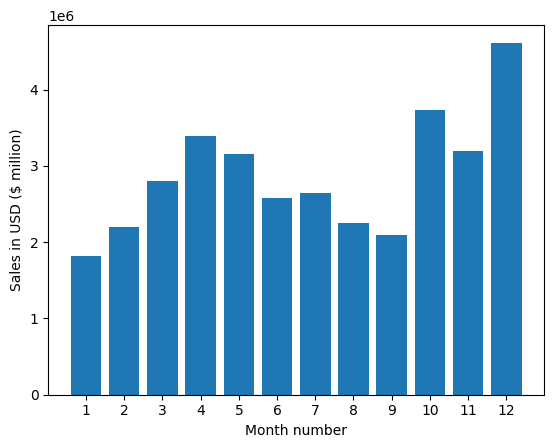

In [40]:
import matplotlib.pyplot as plt

months = range(1,13)
plt.bar(months,result['Sales'])
plt.xticks(months)
plt.ylabel('Sales in USD ($ million)')
plt.xlabel('Month number')
plt.show()

 **Conclusion:** From the above bar graph, we can conclude that, December (i.e 12) is the month with the best sales, while January is with the least amount of sales. In December the company earned 4588415.41 Dollars (i.e approximately 4.5 Million Dollars). The most logical explanation for this occurrence can be holidays like Christmas and New Years, when people mostly buy gifts.

# **Question 2: What city had the highest number of sales?**

In [41]:
result = all_data.groupby('City').sum()
result

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address,Month,Sales
City,,,,,,,,
Atlanta (GA),2481552481652481732482002482052482532482692482...,USB-C Charging CableLightning Charging CableAp...,16602,2779908.20,09/01/19 19:0309/15/19 12:4209/14/19 20:4709/2...,"125 5th St, Atlanta, GA 30301585 Adams St, Atl...",104794,2795498.58
Austin (TX),2481522481752481922482272483102483182483292483...,USB-C Charging CableiPhoneAAA Batteries (4-pac...,11153,1809873.61,09/29/19 10:1909/08/19 13:5809/21/19 09:1609/0...,"511 8th St, Austin, TX 73301736 4th St, Austin...",69829,1819581.75
Boston (MA),2481662481702481722481992482122482172482262482...,Apple Airpods HeadphonesAAA Batteries (4-pack)...,22528,3637409.77,09/04/19 14:5909/04/19 02:0109/13/19 16:4909/1...,"21 9th St, Boston, MA 02215857 Main St, Boston...",141112,3661642.01
Dallas (TX),2481742481942481952481962482332482442482452482...,Bose SoundSport Headphones20in MonitorThinkPad...,16730,2752627.82,09/17/19 22:5709/29/19 20:5009/10/19 23:2909/2...,"385 Washington St, Dallas, TX 75001519 Cherry ...",104620,2767975.40
Los Angeles (CA),2481512481532481562481582481782481872482022482...,AA Batteries (4-pack)USB-C Charging Cable34in ...,33289,5421435.23,09/17/19 14:4409/16/19 17:4809/13/19 14:5909/0...,"380 North St, Los Angeles, CA 90001151 Johnson...",208325,5452570.80
New York City (NY),2481592481712481712481792481802481812481822481...,Vareebadd PhoneUSB-C Charging CableUSB-C Charg...,27932,4635370.83,09/06/19 16:4509/05/19 15:0609/05/19 15:0609/1...,"664 Wilson St, New York City, NY 10001705 Hill...",175741,4664317.43
Portland (ME),2481572482082482602483172483582483792484462485...,Lightning Charging CableMacbook Pro LaptopAppl...,2750,447189.25,09/07/19 09:5909/11/19 19:3009/26/19 15:1609/1...,"773 Johnson St, Portland, ME 0410122 7th St, P...",17144,449758.27
Portland (OR),2481632481972481982482852482872482942482992483...,USB-C Charging CableApple Airpods HeadphonesAA...,11303,1860558.22,09/25/19 12:3209/02/19 19:3909/10/19 00:0609/3...,"41 North St, Portland, OR 97035339 Highland St...",70621,1870732.34
San Francisco (CA),2481602481612481642481672481682481692481762481...,Wired HeadphonesUSB-C Charging Cable27in FHD M...,50239,8211461.74,09/01/19 22:0309/24/19 16:2609/12/19 15:5709/0...,"446 9th St, San Francisco, CA 94016439 Spruce ...",315520,8262203.91


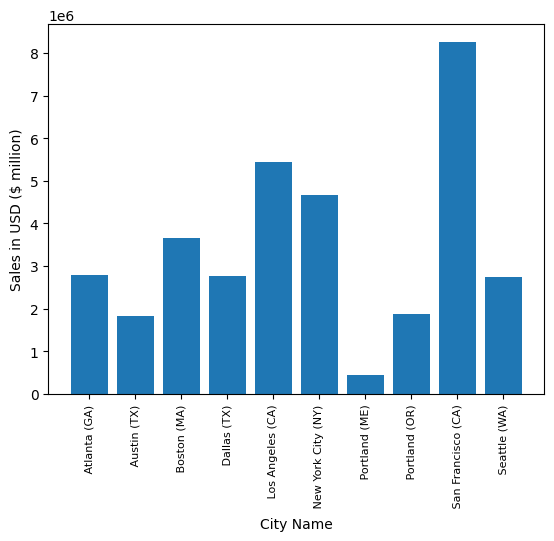

In [42]:
import matplotlib.pyplot as plt

cities = [city for city, df in all_data.groupby('City')]

plt.bar(cities, result['Sales'])
plt.xticks(cities, rotation='vertical', size=8)
plt.ylabel('Sales in USD ($ million)')
plt.xlabel('City Name')
plt.show()

**Conclusion:** From the above graph , it is concluded that in the year 2019 San Francisco (CA), with sales reaching 8.26 Million Dollars ( specifically 8262203.91 Dollars )

# **Question 3: What time should we dislay advertisement to maximize likelihood of customer's buying product?**

In [44]:
all_data['Order Date'] = pd.to_datetime(all_data['Order Date'])

/tmp/ipython-input-44-3842191188.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  all_data['Order Date'] = pd.to_datetime(all_data['Order Date'])


In [47]:
all_data['Hour'] = all_data['Order Date'].dt.hour
all_data['Minute'] = all_data['Order Date'].dt.minute

all_data.head()

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address,Month,Sales,City,Hour,Minute
0,248151,AA Batteries (4-pack),4,3.84,2019-09-17 14:44:00,"380 North St, Los Angeles, CA 90001",9,15.36,Los Angeles (CA),14,44
1,248152,USB-C Charging Cable,2,11.95,2019-09-29 10:19:00,"511 8th St, Austin, TX 73301",9,23.90,Austin (TX),10,19
2,248153,USB-C Charging Cable,1,11.95,2019-09-16 17:48:00,"151 Johnson St, Los Angeles, CA 90001",9,11.95,Los Angeles (CA),17,48
3,248154,27in FHD Monitor,1,149.99,2019-09-27 07:52:00,"355 Hickory St, Seattle, WA 98101",9,149.99,Seattle (WA),7,52
4,248155,USB-C Charging Cable,1,11.95,2019-09-01 19:03:00,"125 5th St, Atlanta, GA 30301",9,11.95,Atlanta (GA),19,3


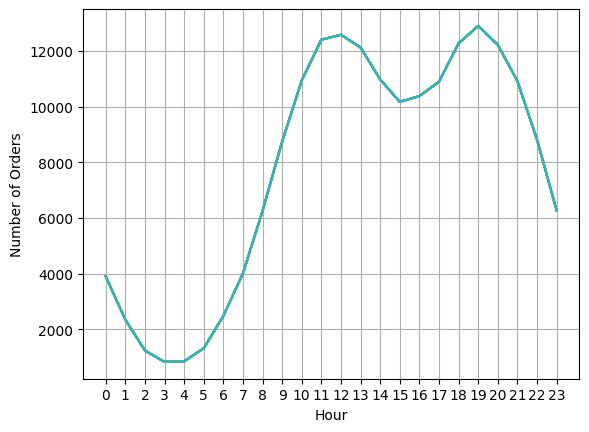

In [52]:
hours = [hour for hour, df in all_data.groupby('Hour')]

plt.plot(hours, all_data.groupby(['Hour']).count())
plt.xticks(hours)
plt.xlabel('Hour')
plt.ylabel('Number of Orders')
plt.grid()
plt.show()

**Conclusion:** The above line chart shows that the peak hours for sales are 1200 hours (i.e 12PM) and 1900 hours (i.e 7PM). So to increase the number of sales, the advertisement should be displayed around an hour before these time periods (i.e around 11AM and 6PM).

#**Question 4: What product are most often sold together?**

In [56]:
df = all_data[all_data['Order ID'].duplicated(keep=False)]

df['Grouped'] = df.groupby('Order ID')['Product'].transform(lambda x: ','.join(x))
df = df[['Order ID', 'Grouped']].drop_duplicates()
df.head()

/tmp/ipython-input-56-2077551221.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Grouped'] = df.groupby('Order ID')['Product'].transform(lambda x: ','.join(x))


,Order ID,Grouped
20,248171,"USB-C Charging Cable,USB-C Charging Cable"
60,248210,"iPhone,Lightning Charging Cable"
70,248219,"Bose SoundSport Headphones,Google Phone"
117,248265,"Vareebadd Phone,Bose SoundSport Headphones"
176,248323,"Google Phone,Bose SoundSport Headphones"


In [60]:
from itertools import combinations
from collections import Counter

count = Counter()

for row in df['Grouped']:
  row_list = row.split(',')
  count.update(Counter(combinations(row_list, 2)))

for key, value in count.most_common(10):
  print(key, value)

('iPhone', 'Lightning Charging Cable') 1005
('Google Phone', 'USB-C Charging Cable') 987
('iPhone', 'Wired Headphones') 447
('Google Phone', 'Wired Headphones') 414
('Vareebadd Phone', 'USB-C Charging Cable') 361
('iPhone', 'Apple Airpods Headphones') 360
('Google Phone', 'Bose SoundSport Headphones') 220
('USB-C Charging Cable', 'Wired Headphones') 160
('Vareebadd Phone', 'Wired Headphones') 143
('Lightning Charging Cable', 'Wired Headphones') 92


**Conclusion:** The above results show the list of products that are often bought together along with how many times they are bought together in the past year. From this we can observe that Iphone And a Lightning Charging Cable are mostly bought together (i.e 1005 times in 2019).

#**Question 5: What product sold the most? Why do you think it sold the most?**

In [64]:
all_data.head()

,Order ID,Product,Quantity Ordered,Price Each,Order Date,Purchase Address,Month,Sales,City,Hour,Minute
0,248151,AA Batteries (4-pack),4,3.84,2019-09-17 14:44:00,"380 North St, Los Angeles, CA 90001",9,15.36,Los Angeles (CA),14,44
1,248152,USB-C Charging Cable,2,11.95,2019-09-29 10:19:00,"511 8th St, Austin, TX 73301",9,23.90,Austin (TX),10,19
2,248153,USB-C Charging Cable,1,11.95,2019-09-16 17:48:00,"151 Johnson St, Los Angeles, CA 90001",9,11.95,Los Angeles (CA),17,48
3,248154,27in FHD Monitor,1,149.99,2019-09-27 07:52:00,"355 Hickory St, Seattle, WA 98101",9,149.99,Seattle (WA),7,52
4,248155,USB-C Charging Cable,1,11.95,2019-09-01 19:03:00,"125 5th St, Atlanta, GA 30301",9,11.95,Atlanta (GA),19,3


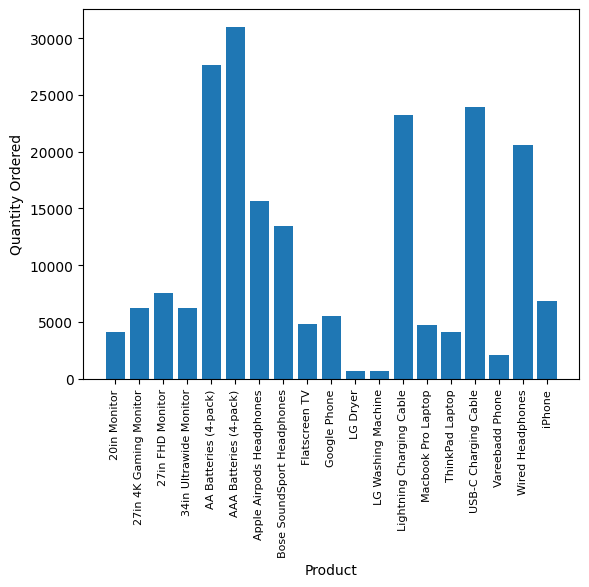

In [70]:
product_group = all_data.groupby('Product')
quantity_ordered = product_group['Quantity Ordered'].sum()

products = [product for product, df in product_group]

plt.bar(products, quantity_ordered)
plt.ylabel('Quantity Ordered')
plt.xlabel('Product')
plt.xticks(products, rotation='vertical', size=8)
plt.show()

/tmp/ipython-input-86-3934890519.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axl.set_xticklabels(products, rotation='vertical', size=8)


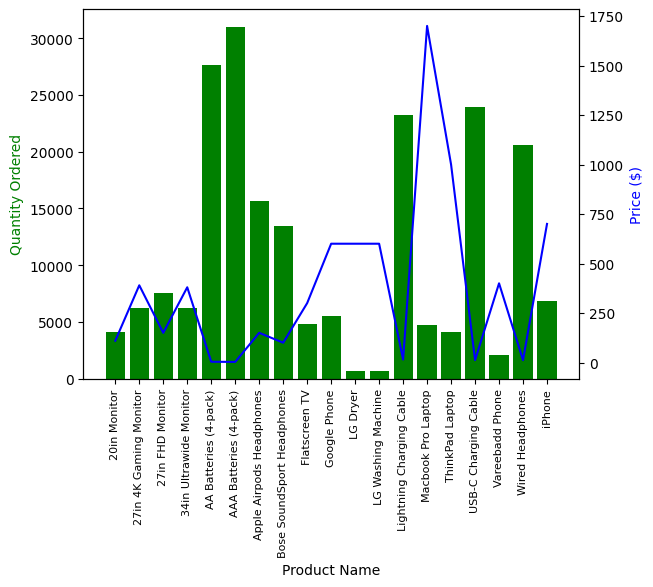

In [86]:
all_data['Price Each'] = pd.to_numeric(all_data['Price Each'], errors='coerce')

all_data = all_data.dropna(subset=['Price Each'])
prices = all_data.groupby('Product')['Price Each'].mean()

fig, axl = plt.subplots()

ax2 = axl.twinx()
axl.bar(products, quantity_ordered, color='g')
ax2.plot(products, prices, color='b')

axl.set_xlabel('Product Name')
axl.set_ylabel('Quantity Ordered', color='g')
ax2.set_ylabel('Price ($)', color='b')
axl.set_xticklabels(products, rotation='vertical', size=8)

plt.show()


**Conclusion:** The above graph shows that AAA and AA Batteries are the most sold Product in 2019.
And to answer the question 'Why they sold the most?' can be answered from two different perspectives:


1.   From financial perspective, we can assume that the AAA and AA batteries sold the most bescause they are the cheapest product in the store.
2.   From a logical perspective, we can assume that AAA and AA batteries sold the most because the have a limited time usage. We can observe that te least sold products are LG Dryer and Washing Machine, these kind of products are bought once and used for many years, but product like AAA and AA batteries are used for a limited amount of time and are also widely used in daily life, like in  TV remotes, alarm clocks, etc. Hence leading to large number of sales.